In [1]:
import numpy as np
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="2"
from nibabel.testing import data_path
import nibabel as nib
from glob import glob
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import time
import datetime
import json
from collections import defaultdict

In [2]:
import itertools
from keras.models import load_model
from keras.utils.vis_utils import plot_model
from sklearn import preprocessing

In [ ]:
f = open("/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train2/map_GT_test.txt")
map_test = json.load(f)
f = open("/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/map_GT_train.txt")
map_train = json.load(f)
f = open("/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train2/map_GT_train.txt")
map_train2 = json.load(f)
f = open("/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train3/map_GT_train.txt")
map_train3 = json.load(f)
f = open("/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train4/map_GT_train.txt")
map_train4 = json.load(f)

# Crossvalidation

In [ ]:
tracin_score2 = []
tracin_score3 = []
tracin_score4 = []
norm2 = []
norm3 = []
norm4 = []

for i in range(1,4):
    print(f"load dice_{i}")

    tracin_score2.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train2/test_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    tracin_score3.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train3/test_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    tracin_score4.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train4/test_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
    print(f"load norm for dice_{i}")
    norm2.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train2/train_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    norm3.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train3/train_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    norm4.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train4/train_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
    
    
    
    
    

In [ ]:
train23 = set(list(map_train3.values())) & set(list(map_train2.values()))
train43 = set(list(map_train3.values())) & set(list(map_train4.values()))
train42 = set(list(map_train4.values())) & set(list(map_train2.values()))

In [ ]:
score_23_2 = np.zeros((3,), dtype = object)
score_23_3 = np.zeros((3,), dtype = object)
score_43_3 = np.zeros((3,), dtype = object)
score_43_4 = np.zeros((3,), dtype = object)
score_42_2 = np.zeros((3,), dtype = object)
score_42_4 = np.zeros((3,), dtype = object)
index23_2 = [int(list(map_train2.keys())[list(map_train2.values()).index(i)]) for i in list(train23)]
index23_3 = [int(list(map_train3.keys())[list(map_train3.values()).index(i)]) for i in list(train23)]
index43_3 = [int(list(map_train3.keys())[list(map_train3.values()).index(i)]) for i in list(train43)]
index43_4 = [int(list(map_train4.keys())[list(map_train4.values()).index(i)]) for i in list(train43)]
index42_2 = [int(list(map_train2.keys())[list(map_train2.values()).index(i)]) for i in list(train42)]
index42_4 = [int(list(map_train4.keys())[list(map_train4.values()).index(i)]) for i in list(train42)]

for dice in range(3):
    for i in list(tracin_score2[dice].keys()):
        score_23_2[dice] = []
        score_23_3[dice] = []
        for j in range(len(index23_2)):
            for l in range(index23_2[j], index23_2[j]+10):
                score_23_2[dice].append(tracin_score2[dice][i][l])
            for l in range(index23_2[j], index23_2[j]+10):
                score_23_3[dice].append(tracin_score3[dice][i][l])


    for i in list(tracin_score2[dice].keys()):
        score_43_3[dice] = []
        score_43_4[dice] = []
        for j in range(len(index43_3)):
            for l in range(index43_4[j], index43_4[j]+10):
                score_43_4[dice].append(tracin_score4[dice][i][l])
            for l in range(index43_3[j], index43_3[j]+10):
                score_43_3[dice].append(tracin_score3[dice][i][l])


    for i in list(tracin_score2[dice].keys()):
        score_42_2[dice] = []
        score_42_4[dice] = []
        for j in range(len(index42_2)):
            for l in range(index42_2[j], index42_2[j]+10):
                score_42_2[dice].append(tracin_score2[dice][i][l])
            for l in range(index42_4[j], index42_4[j]+10):
                score_42_4[dice].append(tracin_score4[dice][i][l])

In [ ]:
a = []
b = []
c = []
for i in range(3):
    
    indx = []
    for j in range(len(score_23_2[i])):
        if score_23_2[i][j] == 0 or score_23_3[i][j] == 0 or np.isnan(score_23_2[i][j]) or np.isnan(score_23_3[i][j]):
            indx.append(j)
    score_23_2[i] = [k for j, k in enumerate(score_23_2[i]) if j not in indx]
    score_23_3[i] = [k for j, k in enumerate(score_23_3[i]) if j not in indx]
    
    a.append(np.array(score_23_2[i])@np.array(score_23_3[i])/np.sqrt((np.array(score_23_2[i])@np.array(score_23_2[i]))*(np.array(score_23_3[i])@np.array(score_23_3[i]))))

    indx = []
    for j in range(len(score_43_3[i])):
        if score_43_4[i][j] == 0 or score_43_3[i][j] == 0 or np.isnan(score_43_4[i][j]) or np.isnan(score_43_3[i][j]):
            indx.append(j)
    score_43_4[i] = [k for j, k in enumerate(score_43_4[i]) if j not in indx]
    score_43_3[i] = [k for j, k in enumerate(score_43_3[i]) if j not in indx]
    b.append(np.array(score_43_4[i])@np.array(score_43_3[i])/np.sqrt((np.array(score_43_4[i])@np.array(score_43_4[i]))*(np.array(score_43_3[i])@np.array(score_43_3[i]))))
    indx = []     
    for j in range(len(score_42_2[i])):
        if score_42_2[i][j] == 0 or score_42_4[i][j] == 0  or np.isnan(score_42_2[i][j]) or np.isnan(score_42_4[i][j]):
            indx.append(j)
    score_42_2[i] = [k for j, k in enumerate(score_42_2[i]) if j not in indx]
    score_42_4[i] = [k for j, k in enumerate(score_42_4[i]) if j not in indx]
    c.append(np.array(score_42_2[i])@np.array(score_42_4[i])/np.sqrt((np.array(score_42_2[i])@np.array(score_42_2[i]))*(np.array(score_42_4[i])@np.array(score_42_4[i]))))
            
        

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

corr = np.zeros((3,3))

for dice in range(3):
    fig, axes = plt.subplots(ncols=3, figsize=(15,5))

    # Create the first scatter plot
    sns.scatterplot(x=score_42_4[dice], y=score_42_2[dice], ax=axes[0], color='red', s = 3)
    axes[0].set_title('Iteration 1 vs 2')
    axes[0].set(xlabel='tracin_score 1', ylabel='tracin_score 2')
    corr[dice,0], _ = pearsonr(score_42_4[dice],score_42_2[dice])
    axes[0].annotate(f'Corr: {corr[dice,0]:.2f}', xy=(0.7, 0.9), xycoords='axes fraction')

    print(np.corrcoef(score_42_4[dice],score_42_2[dice])[0][1])

    # Create the second scatter plot
    sns.scatterplot(x=score_43_4[dice], y=score_43_3[dice], ax=axes[1], color='blue', s = 3)
    axes[1].set_title('Iteration 1 vs 3')
    axes[1].set(xlabel='tracin_score 1', ylabel='tracin_score 3')
    corr[dice,1], _ = pearsonr(score_43_4[dice],score_43_3[dice])
    axes[1].annotate(f'Corr: {corr[dice,1]:.2f}', xy=(0.7, 0.9), xycoords='axes fraction')

    print(np.corrcoef(score_43_4[dice],score_43_3[dice])[0][1])

    # Create the third scatter plot
    sns.scatterplot(x=score_23_2[dice], y=score_23_3[dice], ax=axes[2], color='green', s = 3)
    axes[2].set_title('Iteration 2 vs 3')
    axes[2].set(xlabel='tracin_score 2', ylabel='tracin_score 3')
    corr[dice,2], _ = pearsonr(score_23_2[dice],score_23_3[dice])
    axes[2].annotate(f'Corr: {corr[dice,2]:.2f}', xy=(0.7, 0.9), xycoords='axes fraction')
    # Add a title to the figure
    fig.suptitle(f'K-fold Crossvalidation for tracin_score of dice_{dice+1}')

    print(np.corrcoef(score_23_2[dice],score_23_3[dice])[0][1])
    # Show the plot

    #plt.savefig(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/crossvalidation.png")
    plt.show()

# Correlation between dice

In [ ]:
score_tracin = np.zeros((len(tracin_score2), 3,len(tracin_score2[0]), len(tracin_score2[0][0])))
for dice in range(len(tracin_score2)):
    for key1 in sorted(list(tracin_score2[dice].keys())):
        for key2 in sorted(list(tracin_score2[dice][key1].keys())):
            if norm2[dice][key2][key2]!= 0:
                score_tracin[dice,0, key1, key2] = tracin_score2[dice][key1][key2]/norm2[dice][key2][key2]
            if norm3[dice][key2][key2]!= 0:
                score_tracin[dice,1, key1, key2] = tracin_score3[dice][key1][key2]/norm3[dice][key2][key2]
            if norm4[dice][key2][key2]!= 0:
                score_tracin[dice,2, key1, key2] = tracin_score4[dice][key1][key2]/norm4[dice][key2][key2]

In [ ]:
score_tracin = score_tracin.reshape((3,-1))

In [ ]:
from scipy.stats import pearsonr  # For calculating correlation


fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
num_cols = 3
col_names = ["DICE 1", "DICE 2", "DICE 3"]
for i in range(num_cols):
    for j in range(num_cols):
        ax = axes[i, j]

        if i == j:
            # Histogram on the diagonal
            ax.hist(score_tracin[i,:], bins=10)
            ax.set_title(col_names[i])
        else:
            # Scatter plot on the off-diagonal
            ax.scatter(score_tracin[j,:], score_tracin[i,:], s = 0.5)
            ax.set_xlabel(col_names[j])
            ax.set_ylabel(col_names[i])

            corr, _ = pearsonr(score_tracin[j,:], score_tracin[i,:])
            ax.annotate(f'Corr: {corr:.2f}', xy=(0.7, 0.9), xycoords='axes fraction')

        if j > i:
            ax.set_visible(False)  # Hide upper-right subplots

#plt.suptitle(f'Pair Plot with Correlation Coefficients of train_{train+1}', fontsize=16)
plt.tight_layout()
plt.show()


# Feature visuali Brats

In [3]:
tracin_score = []
norm = []


for i in range(1,4):
    print(f"load dice_{i}")

    tracin_score.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/test_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
    print(f"load norm for dice_{i}")
    norm.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
   

load dice_1
load norm for dice_1
load dice_2
load norm for dice_2
load dice_3
load norm for dice_3


In [4]:
t = []
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1vs2.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1vs3.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice2vs3.npy",allow_pickle='TRUE').item())







In [13]:
score = np.zeros((3*len(norm[0]), 3*len(norm[0])))
dice = 0
for key1 in list(norm[dice].keys()):
    for key2 in list(norm[dice][key1].keys()):
            score[key1, key2] = norm[0][key1][key2]
            score[key1, 2070+key2] = t[0][key1][key2]
            score[key1,2*2070+key2] = t[1][key1][key2]
            score[2070+key1,key2] = t[0][key1][key2]
            score[2070+key1, 2070+key2] = norm[1][key1][key2]
            score[2070+key1,2*2070+key2] = t[2][key1][key2]
            score[2*2070+key1,key2] = t[1][key1][key2]
            score[2*2070+key1, 2070+key2] = t[2][key1][key2]
            score[2*2070+key1,2*2070+key2] = norm[2][key1][key2]

In [ ]:
score2 = np.zeros((len(norm),len(norm[0]), len(norm[0])))
for dice in range(len(norm)):
    for key1 in sorted(list(norm[dice].keys())):
        for key2 in sorted(list(norm[dice][key1].keys())):
                score2[dice, key1, key2] = norm[dice][key1][key2]

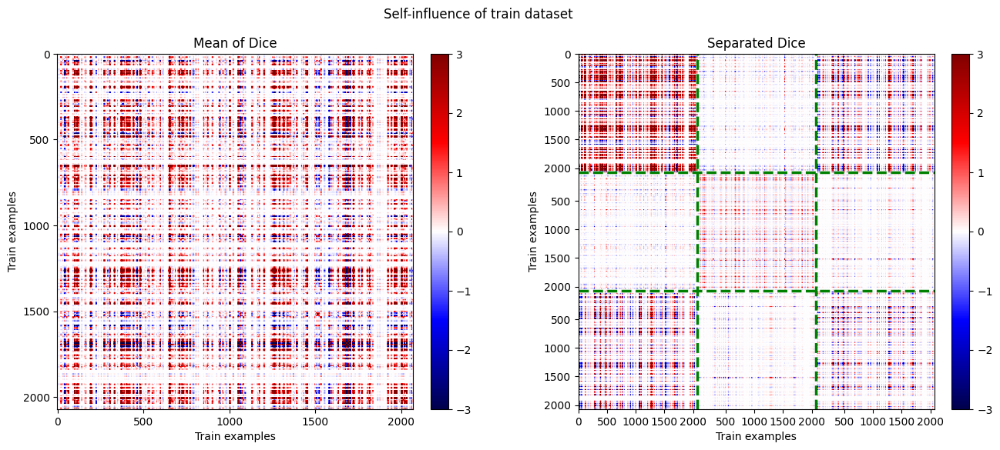

In [134]:
plt.figure(figsize= (16,6))

plt.subplot(1,2,1)
plt.suptitle("Self-influence of train dataset")
plt.imshow(np.mean(score2, axis = 0), vmin = -3, vmax = 3,  cmap = "seismic")
plt.xlabel("Train examples")
plt.ylabel("Train examples")
plt.title("Mean of Dice")
l = list(range(0,2070,500))
l1 = list(range(0,2070,500))

plt.xticks(l1, labels = l)
plt.yticks(l1, labels = l)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(1,2,2)
plt.suptitle("Self-influence of train dataset")
plt.imshow(score, vmin = -3, vmax = 3,  cmap = "seismic")
plt.xlabel("Train examples")
plt.ylabel("Train examples")
plt.title("Separated Dice")
l = list(range(0,2070,500))+list(range(500,2070,500))+list(range(500,2070,500))
l1 = list(range(0,2069,500))+list(range(2070+500,2*2070-1,500))+list(range(2*2070+500,3*2070,500))

plt.xticks(l1, labels = l)
plt.yticks(l1, labels = l)
#plt.xticks([int(2070/2),2070,2070+int(2070/2),2*2070,2*2070+int(2070/2),3*2070], labels = ["Dice 1",2070, "Dice 2", 2070, "Dice 3", 2070])
#plt.yticks([int(2070/2),2070,2070+int(2070/2),2*2070,2*2070+int(2070/2),3*2070], labels = ["Dice 1",2070, "Dice 2", 2070, "Dice 3", 2070])
l = [2070,2*2070]
for i in l:
    plt.axhline(i, color = 'green', linestyle = 'dashed', linewidth = 2.5)
    plt.axvline(i, color = 'green', linestyle = 'dashed', linewidth = 2.5)
plt.colorbar(fraction=0.046, pad=0.04)
plt.show()

# Correlation with features

In [6]:
map_index = {}
for i,j in enumerate(list(tracin_score[0][0].keys())):
    map_index[j] = i

In [7]:
map_index_test = {}
for i,j in enumerate(list(tracin_score[0].keys())):
    map_index_test[j] = i

In [8]:

feature_maps_test = np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/feature_maps_test_SGD2.npz", allow_pickle=True)['feature_maps_test']
feature_maps_train = np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/feature_maps_train_SGD2.npz", allow_pickle=True)['feature_maps_train']


In [9]:
feature_maps_train1 = np.zeros((3,2070,64))


for i in range(3):
    for j in range(2070):
        for k in range(64):
            feature_maps_train1[i,j,k] = np.max(feature_maps_train[i,j,:,:,k])
            

In [10]:
feature_maps_test1 = np.zeros((3,520,64))

for i in range(3):
    for j in range(520):
        for k in range(64):

            feature_maps_test1[i,j,k] = np.max(feature_maps_test[i,j,:,:,k])

In [11]:
score_tracin = np.zeros((3,len(tracin_score[0]), len(tracin_score[0][0])))

for dice in range(3):
    for i in sorted(list(tracin_score[dice].keys())):
        for j in sorted(list(tracin_score[dice][i].keys())):
                score_tracin[dice,i,j] = tracin_score[dice][i][j]
                

#score_tracin = score_tracin.reshape((3,-1))

In [ ]:
t = []
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice2.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice3.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1vs2.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1vs3.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice2vs3.npy",allow_pickle='TRUE').item())



In [13]:
s = []
for k,i in enumerate(t):
    new_score = {}
    for key1 in i:
        m = {}
        for key2 in i[key1]:
            if k == 0 or k == 1 or k ==2:
                m[key2] = i[key1][key2]
            if k == 3: 
                m[2*2070+key2] = i[key1][key2]
            if k == 4 or k ==5:
                m[3*2070+key2] = i[key1][key2]
                
        
        new_score[key1] = m
        
    s.append(new_score)

In [14]:
new_s = np.zeros((3,), dtype = object)
new_s[0] = {}
new_s[1] = {}
new_s[2] = {}

for key in s[0]:
    m = s[0][key]
    m.update(s[3][key])
    m.update(s[4][key])
    new_s[0][key] = m

for key in s[1]:
    m = s[1][key]
    m.update(s[3][key])
    m.update(s[5][key])
    new_s[1][key] = m
    

for key1 in s[4]:
  
    m = {}
    for key2 in s[4][key1]:
        
        m[2*2070+(key2%2070)] = s[4][key1][key2]

    s[4][key1] = m


for key in s[2]:
    m = s[2][key]
    m.update(s[4][key])
    m.update(s[5][key])
    new_s[2][key] = m
    

In [15]:
proponents_score = np.zeros((3,), dtype = object)
for i in range(3):
    proponents_score[i] = [sorted(new_s[i][j].items(), key=lambda x: x[1], reverse = True) for j in list(new_s[i].keys())]
    


In [16]:
def load_image_train(image_file):
    data = np.load(image_file)
    image_file = str(image_file)
    index = "/".join(image_file.split("/", image_file.count("/"))[image_file.count("/"):])
    index = int(index[6:len(index)-5])
    return index, data['X_train'], data['Y_train']


def load_image_test(image_file):
    data = np.load(image_file)
    image_file = str(image_file)
    index = "/".join(image_file.split("/", image_file.count("/"))[image_file.count("/"):])
    index = int(index[5:len(index)-5])
    return index, data['X_test'], data['Y_test']


def load_image_val(image_file):
    data = np.load(image_file)
    image_file = str(image_file)
    index = "/".join(image_file.split("/", image_file.count("/"))[image_file.count("/"):])
    index = int(index[4:len(index)-5])
    return index, data['X_val'], data['Y_val']


def test_reshape(index, X,Y):
    X = tf.cast(X, tf.float32)
    Y = tf.cast(Y, tf.float32)
    X = tf.reshape(X, [192,192,4])
    Y = tf.reshape(Y, [192,192,4])
    return index,X,Y

search_dir = "/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Data/DataTracin_train/"
os.chdir(search_dir)
file_list_train = filter(os.path.isfile, os.listdir(search_dir))
file_list_train = [os.path.join(search_dir, f) for f in file_list_train] # add path to each file
file_list_train.sort(key=lambda x: os.path.getmtime(x))

BATCH_SIZE = 1

train_dataset = tf.data.Dataset.list_files(file_list_train, shuffle = False)
train_dataset = train_dataset.map(lambda item: tf.numpy_function(
          load_image_train, [item], [tf.int64, tf.double, tf.double]),
          num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.map(test_reshape)
train_dataset = train_dataset.batch(BATCH_SIZE)

2023-10-16 21:21:33.576619: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1510] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 23878 MB memory:  -> device: 0, name: Tesla V100-SXM2-32GB, pci bus id: 0000:0a:00.0, compute capability: 7.0


In [17]:
samples_map2 = np.zeros((3,2070,2070,64))
trains = list(range(0,2070,10))

norm_feature_maps_train1 = feature_maps_train1

norm_feature_maps_test1 = feature_maps_test1

p = proponents_score

for dice, p1 in enumerate(p):
    for i,test in enumerate(list(range(2070))):
        for k,train in enumerate(list(range(0,3*2070, 30))):
            dice2 = int(train/2070)
            if dice == 1:
                if dice2 == 0:
                    dice2 = 1
                if dice2 == 1:
                    dice2 = 0
            if dice == 2:
                if dice2 == 0:
                    dice2 = 2
                if dice2 == 2:
                    dice2 = 0
          
                    
            tr = map_index[p[dice][map_index[test]][train][0]%2070]

            for l in range(64):
                norm = np.max([np.abs(norm_feature_maps_train1[dice2,tr,l]),np.abs(norm_feature_maps_train1[dice,map_index[test],l])])
                samples_map2[dice,i,k,l] = norm_feature_maps_train1[dice2,tr,l]*norm_feature_maps_train1[dice,map_index[test],l]/norm**2
                #print(norm**2,samples_map2[dice,i,0,l]*norm**2,samples_map2[dice,i,0,l],norm_feature_maps_test1[dice,map_index_test[test],l],norm_feature_maps_train1[dice,map_index[p[dice][test][train][0]],l] )

/tmp/ipykernel_77674/929889417.py:30: RuntimeWarning: invalid value encountered in double_scalars
  samples_map2[dice,i,k,l] = norm_feature_maps_train1[dice2,tr,l]*norm_feature_maps_train1[dice,map_index[test],l]/norm**2


In [49]:
samples_map2[np.isnan(samples_map2)] = 0
#samples_rad2[np.isnan(samples_rad2)] = 0

In [90]:
a = np.zeros((2070,64), dtype = object)
for i in range(64):
    for j in range(2070):
        a[j,i] = []
    
    
for i in range(2070):
    for j in range(2070):
        for l in range(64):
            if samples_map2[2,i,j,l] != 0:
                a[j,l].append(samples_map2[2,i,j,l])


mean = np.zeros((64), dtype = object)
std = np.zeros((64), dtype = object)

for i in range(64):
    mean[i] = []
    for j in range(2070):
        mean[i].append(np.mean(a[j,i]))

        

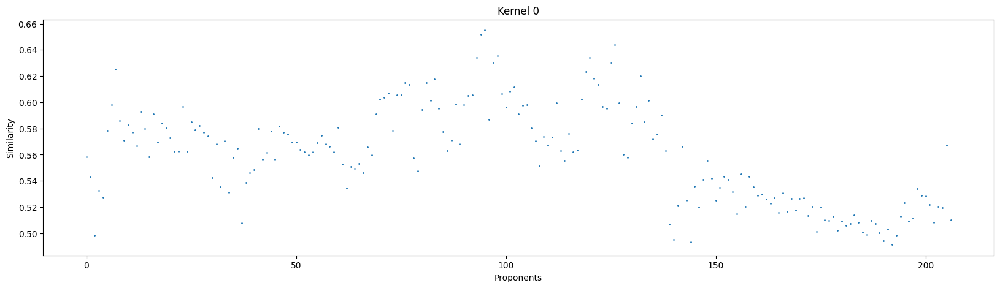

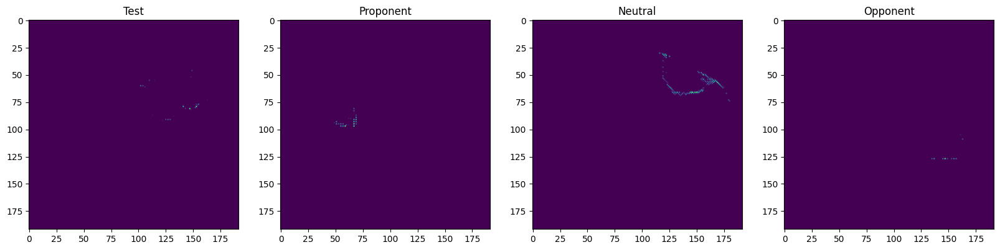

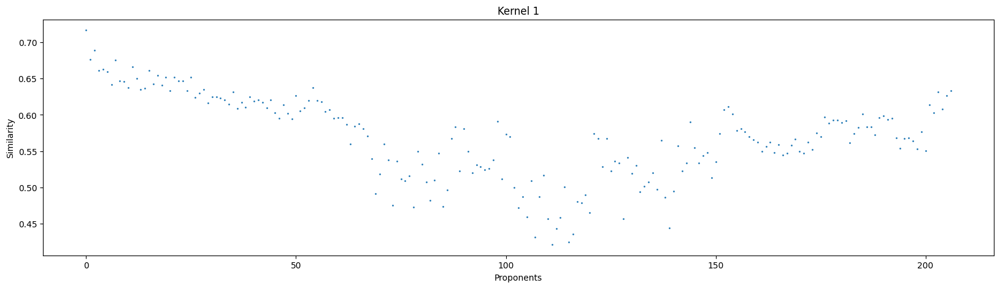

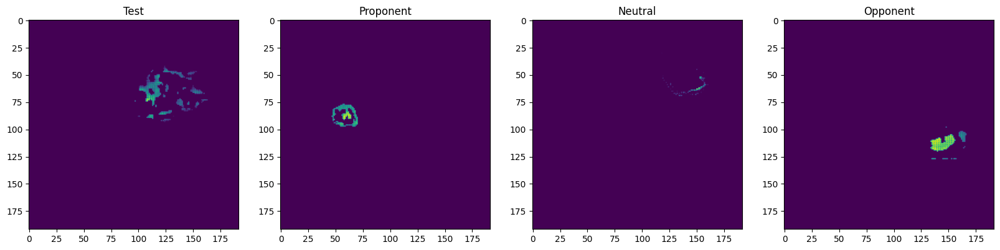

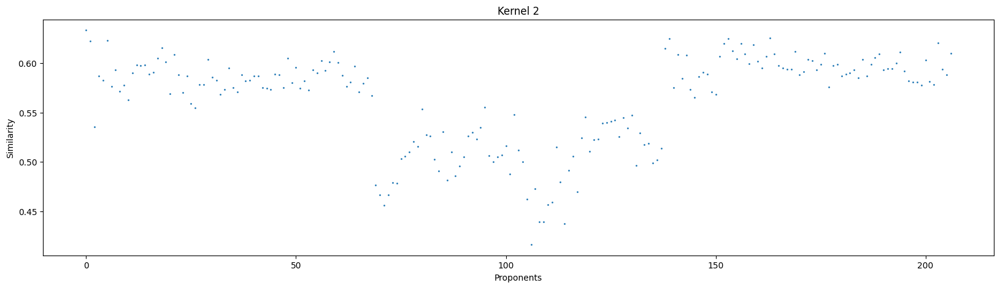

...

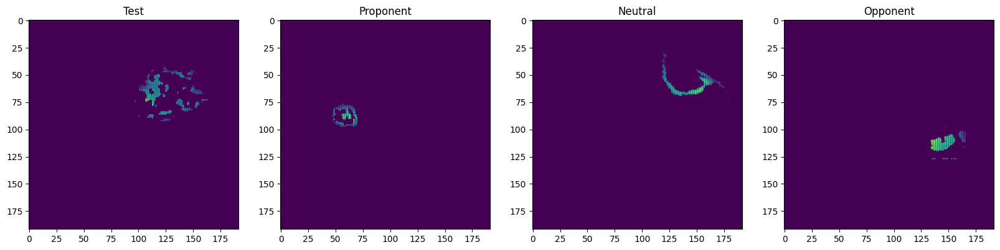

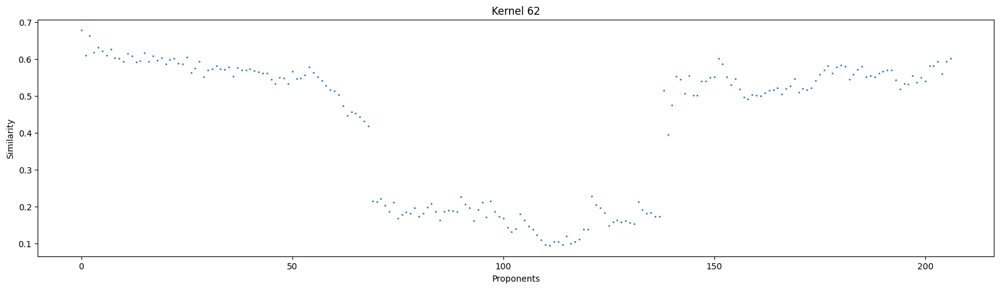

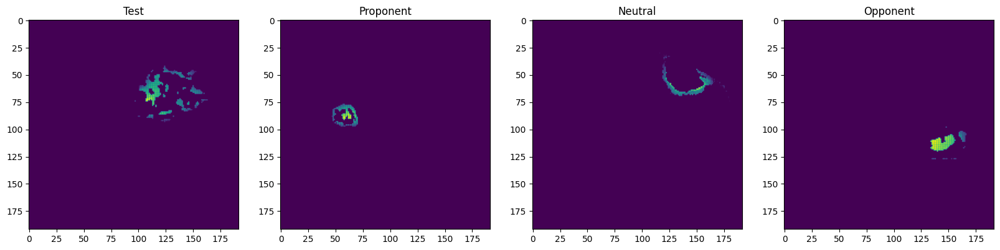

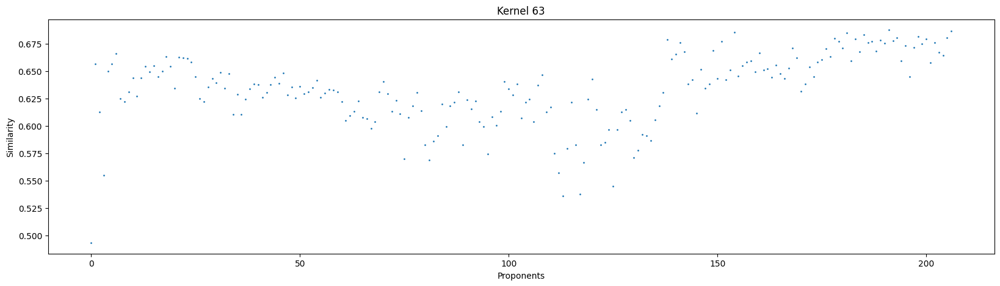

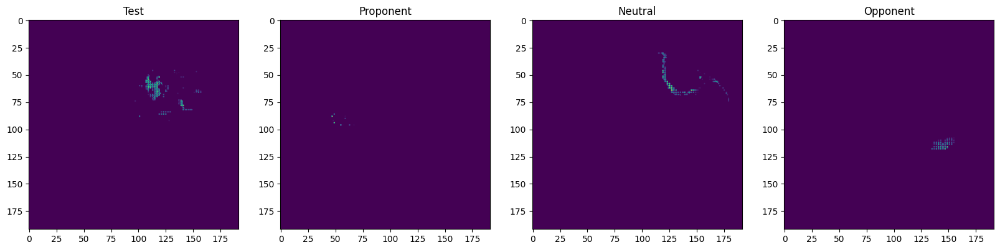

In [29]:
for i in range(64):
    plt.figure(figsize = (20,5))
   
    plt.scatter(range(2070), mean[i], s = 1)
    plt.title(f"Kernel {i}")
    plt.xlabel("Proponents")
    plt.ylabel("Similarity")
    plt.show()
    plt.figure(figsize = (20,5))
    plt.subplot(1,4,1)
    plt.title(f"Test")
    plt.imshow(feature_maps_train[0,4,:,:,i])
    plt.subplot(1,4,2)
    plt.title(f"Proponent")
    plt.imshow(feature_maps_train[0,753,:,:,i])
    plt.subplot(1,4,3)
    plt.title(f"Neutral")
    plt.imshow(feature_maps_train[2,1517,:,:,i])
    plt.subplot(1,4,4)
    plt.title(f"Opponent")
    plt.imshow(feature_maps_train[0,759,:,:,i])
    plt.show()

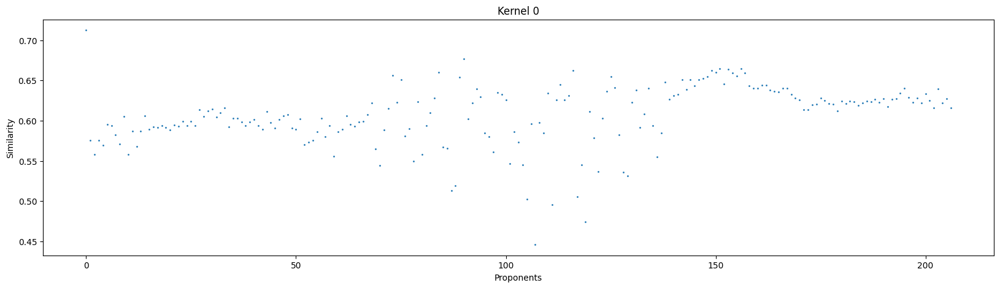

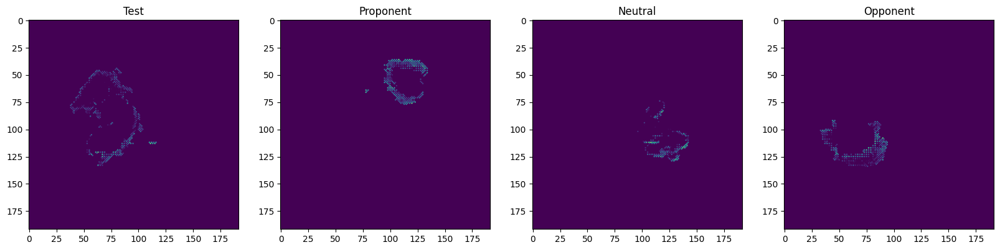

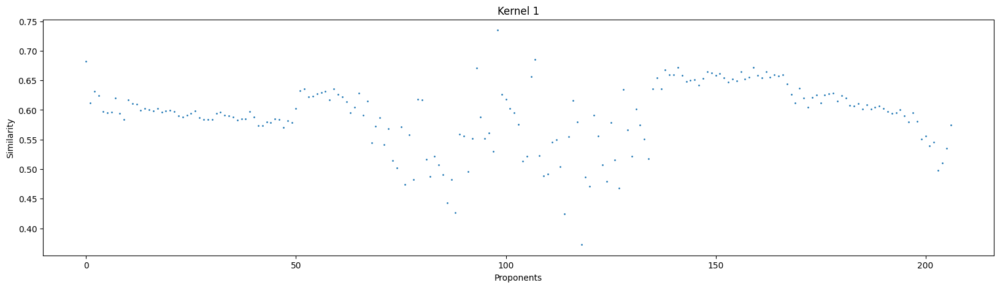

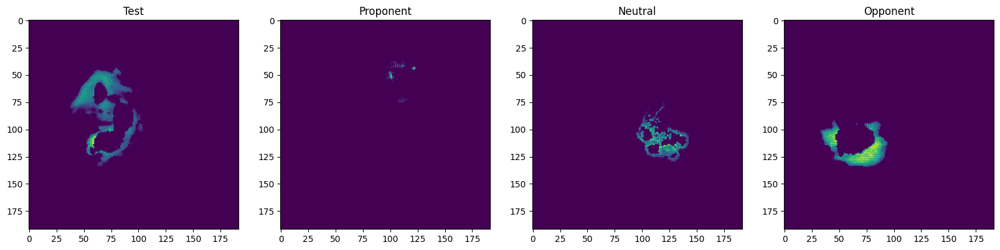

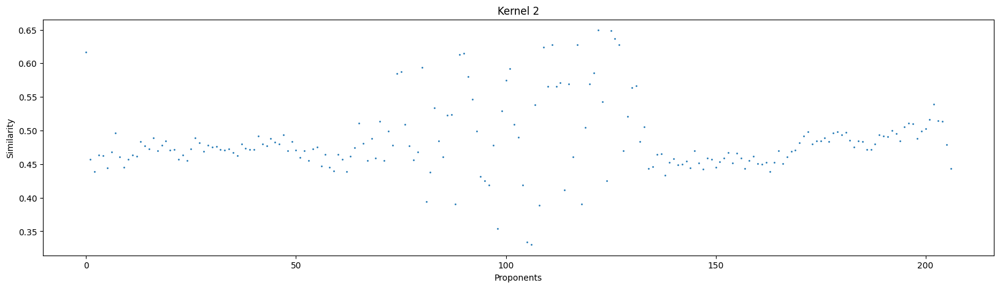

...

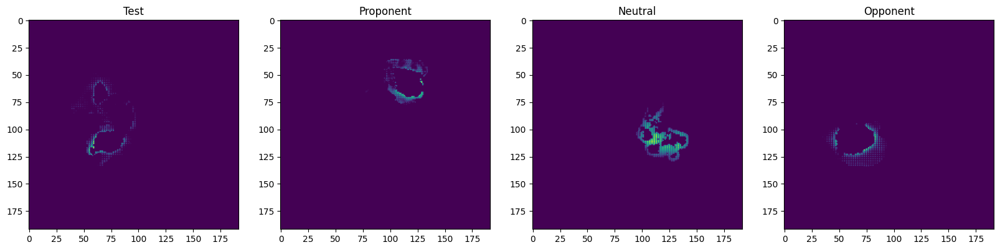

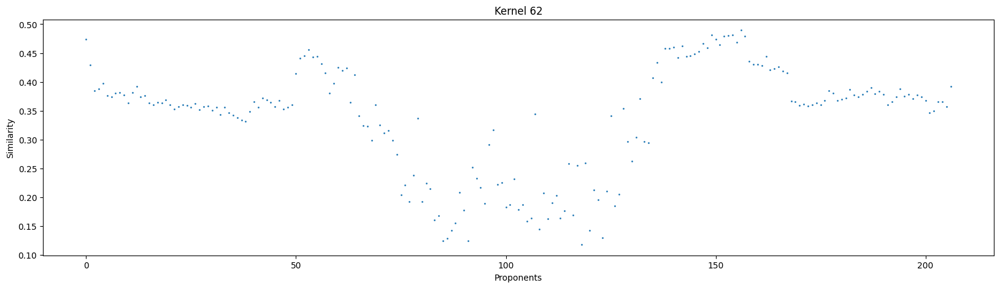

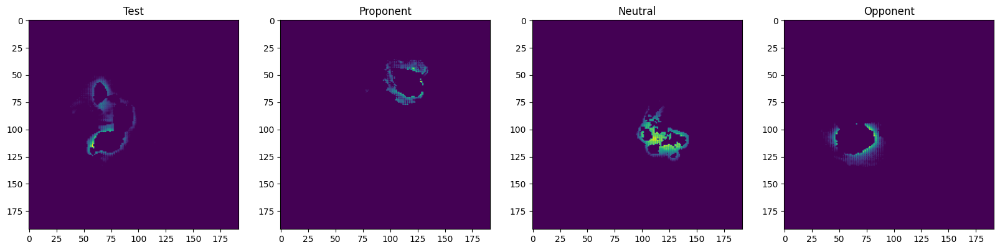

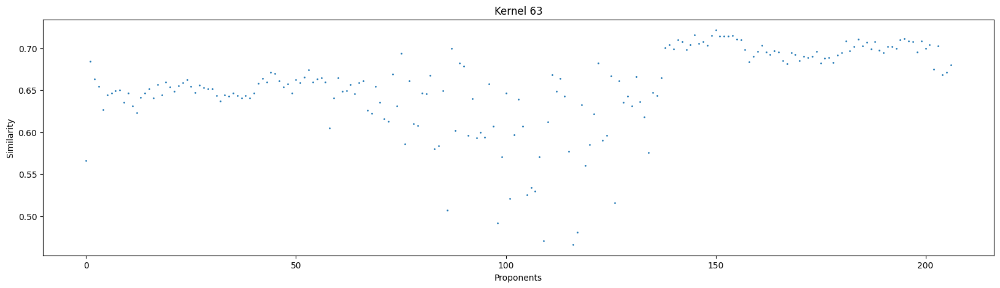

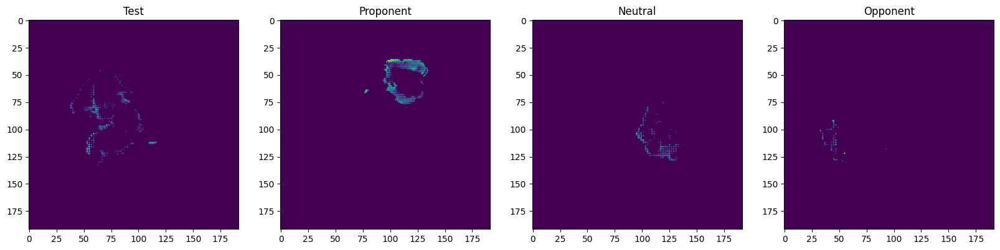

In [89]:
for i in range(64):
    plt.figure(figsize = (20,5))
    
    plt.scatter(range(2070), mean[i], s = 1)
    plt.title(f"Kernel {i}")
    plt.xlabel("Proponents")
    plt.ylabel("Similarity")
    plt.show()
    plt.figure(figsize = (20,5))
    plt.subplot(1,4,1)
    plt.title(f"Test")
    plt.imshow(feature_maps_train[1,504,:,:,i])
    plt.subplot(1,4,2)
    plt.title(f"Proponent")
    plt.imshow(feature_maps_train[1,483,:,:,i])
    plt.subplot(1,4,3)
    plt.title(f"Neutral")
    plt.imshow(feature_maps_train[2,1930,:,:,i])
    plt.subplot(1,4,4)
    plt.title(f"Opponent")
    plt.imshow(feature_maps_train[1,270,:,:,i])
    plt.show()

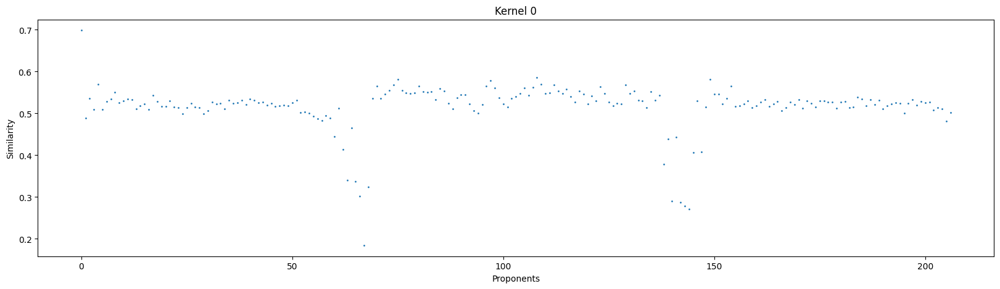

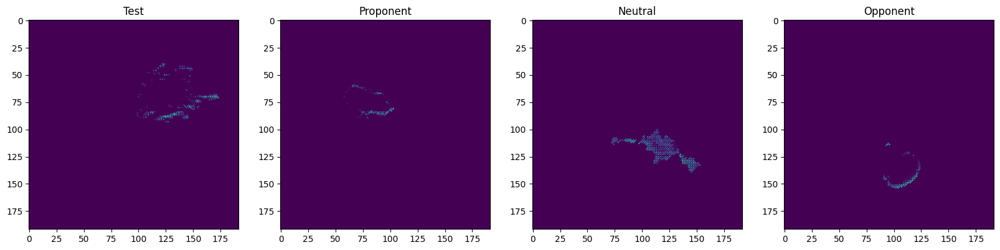

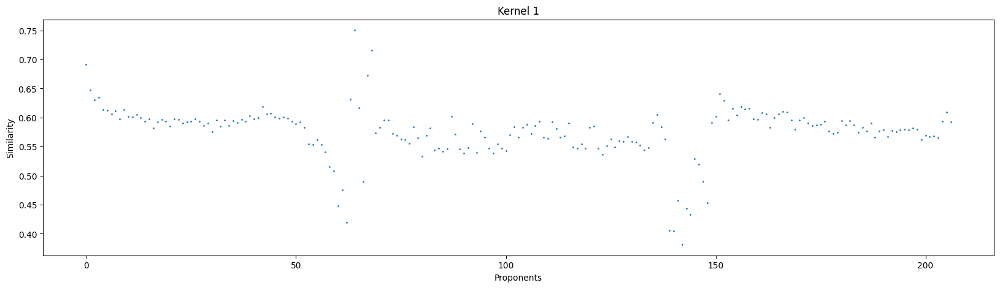

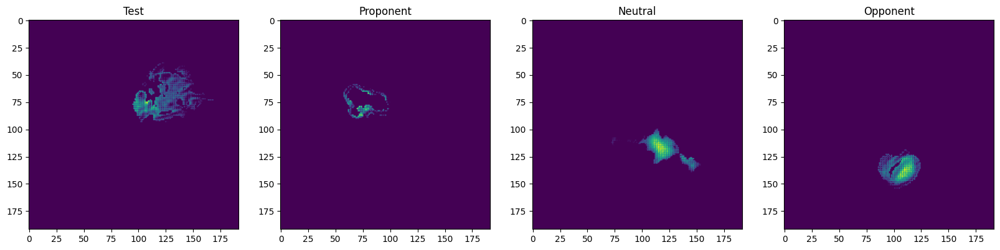

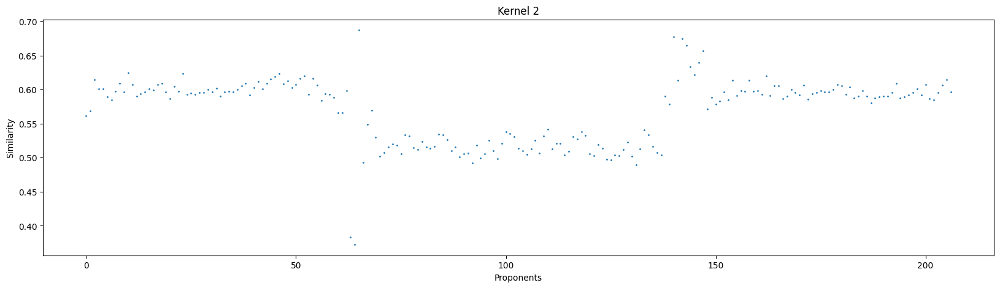

...

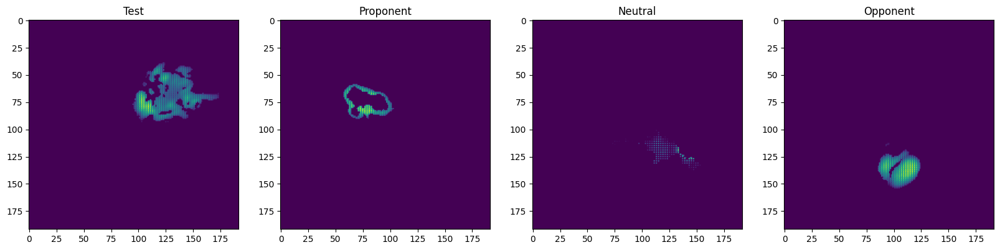

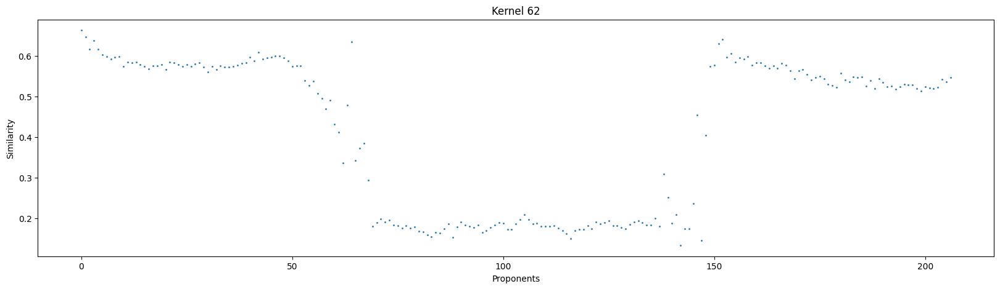

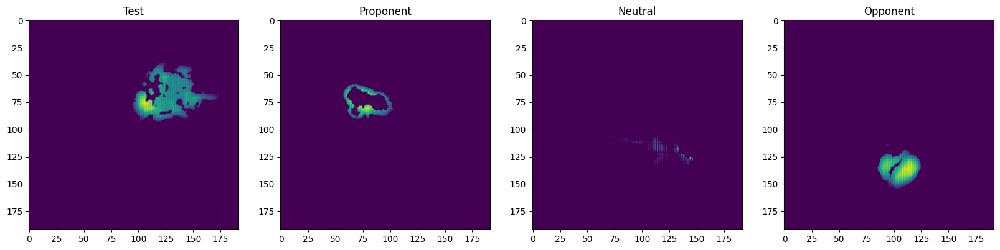

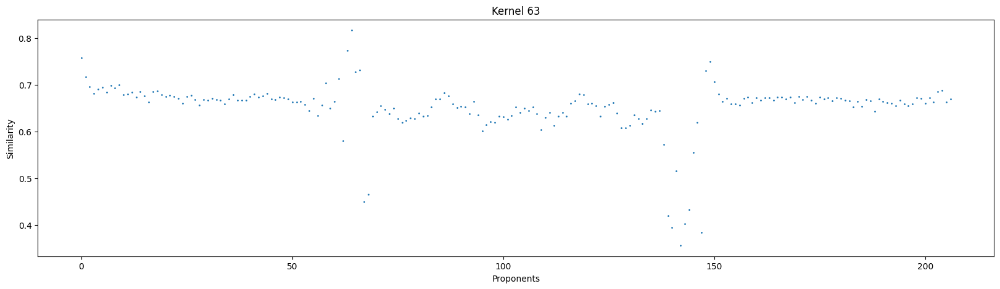

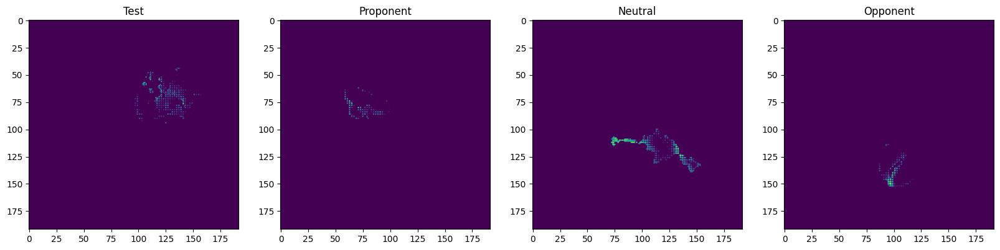

In [128]:
for i in range(64):
    plt.figure(figsize = (20,5))
    
    plt.scatter(range(2070), mean[i], s = 1)
    plt.title(f"Kernel {i}")
    plt.xlabel("Proponents")
    plt.ylabel("Similarity")
    plt.show()
    plt.figure(figsize = (20,5))
    plt.subplot(1,4,1)
    plt.title(f"Test")
    plt.imshow(feature_maps_train[2,4,:,:,i])
    plt.subplot(1,4,2)
    plt.title(f"Proponent")
    plt.imshow(feature_maps_train[2,1264,:,:,i])
    plt.subplot(1,4,3)
    plt.title(f"Neutral")
    plt.imshow(feature_maps_train[1,61,:,:,i])
    plt.subplot(1,4,4)
    plt.title(f"Opponent")
    plt.imshow(feature_maps_train[2,1684,:,:,i])
    plt.show()

# Correlation from different training

In [ ]:

norm = []
norm2 = []
norm3 = []
norm4 = []

for i in range(1,4):

    print(f"load norm for dice_{i}")
    norm.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/train_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    norm2.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/train_vs_train2_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    norm3.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/train_vs_train3_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
    


In [ ]:
score = np.zeros((len(norm2), 3,len(norm2[0]), len(norm2[0])))
for dice in range(len(norm2)):
    for key1 in sorted(list(norm2[dice].keys())):
        for key2 in sorted(list(norm2[dice][key1].keys())):
            
                score[dice,0, key1, key2] = norm[dice][key1][key2]
                score[dice,1, key1, key2] = norm2[dice][key1][key2]
                score[dice,2, key1, key2] = norm3[dice][key1][key2]

In [ ]:
score = score.reshape((len(norm2), 3, -1))

In [ ]:
for dice in range(3):
    norm0 = score[dice,0]@np.transpose(score[dice,0])
    norm1 = score[dice,1]@np.transpose(score[dice,1])
    norm2 = score[dice,2]@np.transpose(score[dice,2])
    print(score[dice,0]@np.transpose(score[dice,1])/np.sqrt(norm0*norm1))
    print(score[dice,0]@np.transpose(score[dice,2])/np.sqrt(norm0*norm2))
    print(score[dice,2]@np.transpose(score[dice,1])/np.sqrt(norm2*norm1))
    

In [ ]:
scalar = np.zeros((3), dtype = object)
scalar[0] = []
scalar[1] = []
scalar[2] = []
for i in range(2070):
    if sum(score[:,1,i].flatten()) == 0 or sum(score[:,2,i].flatten()) == 0:
        pass
    else:
        scalar[0].append(score[:,1,i].flatten()@score[:,2,i].flatten()/np.sqrt((score[:,1,i].flatten()@score[:,1,i].flatten())*score[:,2,i].flatten()@(score[:,2,i].flatten())))
    
    if sum(score[:,1,i].flatten()) == 0 or sum(score[:,3,i].flatten()) == 0:
        pass
    else:
        scalar[1].append(score[:,1,i].flatten()@score[:,3,i].flatten()/np.sqrt((score[:,1,i].flatten()@score[:,1,i].flatten())*score[:,3,i].flatten()@(score[:,3,i].flatten())))
    
    if sum(score[:,2,i].flatten()) == 0 or sum(score[:,3,i].flatten()) == 0:
        pass
    else:
        scalar[2].append(score[:,2,i].flatten()@score[:,3,i].flatten()/np.sqrt((score[:,2,i].flatten()@score[:,2,i].flatten())*score[:,3,i].flatten()@(score[:,3,i].flatten())))
  

In [ ]:
import pandas as pd
df = pd.DataFrame(
    {
     "Train 1 vs 2": scalar[0]}).assign(n = "1 vs 2")
df2 = pd.DataFrame({
     "Train 1 vs 3": scalar[1]}).assign(n = "1 vs 3")

df3 = pd.DataFrame({
     "Train 2 vs 3": scalar[2]}).assign(n = "2 vs 3")

fig,ax = plt.subplots(1)

sns.set_style("whitegrid")

cdf = pd.concat([df,df2,df3])    
mdf = pd.melt(cdf, id_vars=['n'], var_name='Train', value_name='Cosine Similarity')




sns.boxplot(x="n", y="Cosine Similarity", hue='Train', data=mdf, showfliers=False)






for i,artist in enumerate(ax.artists):
    # Set the linecolor on the artist to the facecolor, and set the facecolor to None
    col = artist.get_facecolor()
    artist.set_edgecolor(col)
    artist.set_facecolor('None')

    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
    # Loop over them here, and use the same colour as above
    for j in range(i*5,i*5+5):
        line = ax.lines[j]
        line.set_color(col)
        line.set_mfc(col)
        line.set_mec(col)

# Also fix the legend
for legpatch in ax.get_legend().get_patches():
    col = legpatch.get_facecolor()
    legpatch.set_edgecolor(col)
    legpatch.set_facecolor('None')

plt.ylim(0,1.)
ax.set_xlabel("Train")
plt.show()

In [ ]:
norm = []
norm2 = []
norm3 = []
norm4 = []

for i in range(1,4):

    print(f"load norm for dice_{i}")
    norm.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/train_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    norm2.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/train_vs_train_el_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    norm3.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/train_vs_train_mirr_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    #norm4.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train/train_vs_train_crop_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
    

In [ ]:
score = np.zeros((len(norm2), 3,len(norm2[0]), len(norm2[0])))
for dice in range(len(norm2)):
    for key1 in sorted(list(norm2[dice].keys())):
        for key2 in sorted(list(norm2[dice][key1].keys())):
            
                score[dice,0, key1, key2] = norm[dice][key1][key2]
                score[dice,1, key1, key2] = norm2[dice][key1][key2]
                score[dice,2, key1, key2] = norm3[dice][key1][key2]


In [ ]:
scalar = np.zeros((2), dtype = object)
scalar[0] = []
scalar[1] = []
for i in range(2070):
    if sum(score[:,0,i].flatten()) == 0 or sum(score[:,1,i].flatten()) == 0:
        pass
    else:
        scalar[0].append(score[:,0,i].flatten()@score[:,1,i].flatten()/np.sqrt((score[:,1,i].flatten()@score[:,1,i].flatten())*score[:,0,i].flatten()@(score[:,0,i].flatten())))
    
    if sum(score[:,0,i].flatten()) == 0 or sum(score[:,1,i].flatten()) == 0:
        pass
    else:
        scalar[1].append(score[:,0,i].flatten()@score[:,2,i].flatten()/np.sqrt((score[:,2,i].flatten()@score[:,2,i].flatten())*score[:,0,i].flatten()@(score[:,0,i].flatten())))
    






In [ ]:
import pandas as pd
df = pd.DataFrame(
    {
     "Original vs Elastic deformation": scalar[0]}).assign(n = 0)
df2 = pd.DataFrame({
     "Original vs Mirroring": scalar[1]}).assign(n = 1)



fig,ax = plt.subplots(1)

sns.set_style("whitegrid")

cdf = pd.concat([df,df2])    
mdf = pd.melt(cdf, id_vars=['n'], var_name='Transformations', value_name='Cosine similarity')




sns.boxplot(x="n", y="Cosine similarity", hue='Transformations', data=mdf, showfliers=False)






for i,artist in enumerate(ax.artists):
    # Set the linecolor on the artist to the facecolor, and set the facecolor to None
    col = artist.get_facecolor()
    artist.set_edgecolor(col)
    artist.set_facecolor('None')

    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
    # Loop over them here, and use the same colour as above
    for j in range(i*5,i*5+5):
        line = ax.lines[j]
        line.set_color(col)
        line.set_mfc(col)
        line.set_mec(col)

# Also fix the legend
for legpatch in ax.get_legend().get_patches():
    col = legpatch.get_facecolor()
    legpatch.set_edgecolor(col)
    legpatch.set_facecolor('None')

plt.ylim(0,1.1)
ax.set_xlabel("Transformations")
plt.show()

# Rob


In [8]:
norm = []


for i in range(1,4):
    print(f"load norm for dice_{i}")
    norm.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
t = []
#t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1.npy",allow_pickle='TRUE').item())
#t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice2.npy",allow_pickle='TRUE').item())
#t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice3.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1vs2.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1vs3.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice2vs3.npy",allow_pickle='TRUE').item())


score = np.zeros((3*len(norm[0]), 3*len(norm[0])))
dice = 0
for key1 in list(norm[dice].keys()):
    for key2 in list(norm[dice][key1].keys()):
            score[key1, key2] = norm[0][key1][key2]
            score[key1, 2070+key2] = t[0][key1][key2]
            score[key1,2*2070+key2] = t[1][key1][key2]
            score[2070+key1,key2] = t[0][key1][key2]
            score[2070+key1, 2070+key2] = norm[1][key1][key2]
            score[2070+key1,2*2070+key2] = t[2][key1][key2]
            score[2*2070+key1,key2] = t[1][key1][key2]
            score[2*2070+key1, 2070+key2] = t[2][key1][key2]
            score[2*2070+key1,2*2070+key2] = norm[2][key1][key2]
            
            
            
norm = []


for i in range(1,4):
    print(f"load norm for dice_{i}")
    norm.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train_tracin_score_dice{i}.npy",allow_pickle='TRUE').item())
    
t = []
#t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice1.npy",allow_pickle='TRUE').item())
#t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice2.npy",allow_pickle='TRUE').item())
#t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train2_tracin_score_dice3.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train_tracin_score_dice1vs2.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train_tracin_score_dice1vs3.npy",allow_pickle='TRUE').item())
t.append(np.load(f"/home/tordatom/Dati_Imaging/BraTs_19/Segmentation2D/Crossvalidation/Train_SGD/train_vs_train_tracin_score_dice2vs3.npy",allow_pickle='TRUE').item())


score2 = np.zeros((3*len(norm[0]), 3*len(norm[0])))
dice = 0
for key1 in list(norm[dice].keys()):
    for key2 in list(norm[dice][key1].keys()):
            score2[key1, key2] = norm[0][key1][key2]
            score2[key1, 2070+key2] = t[0][key1][key2]
            score2[key1,2*2070+key2] = t[1][key1][key2]
            score2[2070+key1,key2] = t[0][key1][key2]
            score2[2070+key1, 2070+key2] = norm[1][key1][key2]
            score2[2070+key1,2*2070+key2] = t[2][key1][key2]
            score2[2*2070+key1,key2] = t[1][key1][key2]
            score2[2*2070+key1, 2070+key2] = t[2][key1][key2]
            score2[2*2070+key1,2*2070+key2] = norm[2][key1][key2]

load norm for dice_1
load norm for dice_2
load norm for dice_3
load norm for dice_1
load norm for dice_2
load norm for dice_3


In [28]:
a = np.mean(score[:2070,:2070], axis = 1)@np.mean(score2[:2070,:2070], axis = 1)

In [9]:
norm1 = [np.mean(score[i, :2070])*np.mean(score[i, :2070]) for i in range(2070)]
norm2 = [np.mean(score2[i, :2070])*np.mean(score2[i, :2070]) for i in range(2070)]
a = [(np.mean(score[i, :2070])*np.mean(score2[i, :2070])+1e-5)/np.sqrt(norm1[i]*norm2[i]+1e-5) for i in range(2070)]
norm1 = [np.mean(score[i, 2070:2*2070])*np.mean(score[i, 2070:2*2070]) for i in range(2070)]
norm2 = [np.mean(score2[i, 2070:2*2070])*np.mean(score2[i, 2070:2*2070]) for i in range(2070)]
b = [(np.mean(score[i, 2070:2*2070])*np.mean(score2[i, 2070:2*2070])+1e-5)/np.sqrt(norm1[i]*norm2[i]+1e-5) for i in range(2070)]

In [10]:
np.mean(a), np.mean(b)

(0.34273863011544814, 0.20064222160155562)

In [11]:
a = [np.mean((score[i,:2070]+1e-5)/(score[i,2070:2*2070]+1e-5)) for i in range(2070)]
b = [np.mean((score2[i,:2070]+1e-5)/(score2[i,2070:2*2070]+1e-5)) for i in range(2070)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,:2070]+1e-5)/(score[i,2*2070:3*2070]+1e-5)) for i in range(2070)]
b = [np.mean((score2[i,:2070]+1e-5)/(score2[i,2*2070:3*2070]+1e-5)) for i in range(2070)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,2070:2*2070]+1e-5)/(score[i,2*2070:3*2070]+1e-5)) for i in range(2070)]
b = [np.mean((score2[i,2070:2*2070]+1e-5)/(score2[i,2*2070:3*2070]+1e-5)) for i in range(2070)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,2070:2*2070]+1e-5)/(score[i,:2070]+1e-5)) for i in range(2070,2070*2)]
b = [np.mean((score2[i,2070:2*2070]+1e-5)/(score2[i,:2070]+1e-5)) for i in range(2070,2070*2)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,2070:2*2070]+1e-5)/(score[i,2*2070:3*2070]+1e-5)) for i in range(2070,2070*2)]
b = [np.mean((score2[i,2070:2*2070]+1e-5)/(score2[i,2*2070:3*2070]+1e-5)) for i in range(2070,2070*2)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,:2070]+1e-5)/(score[i,2*2070:3*2070]+1e-5)) for i in range(2070,2070*2)]
b = [np.mean((score2[i,:2070]+1e-5)/(score2[i,2*2070:3*2070]+1e-5)) for i in range(2070,2070*2)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,2*2070:3*2070]+1e-5)/(score[i,:2070]+1e-5)) for i in range(2*2070,2070*3)]
b = [np.mean((score2[i,2*2070:3*2070]+1e-5)/(score2[i,:2070]+1e-5)) for i in range(2*2070,2070*3)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,2*2070:3*2070]+1e-5)/(score[i,2070:2*2070]+1e-5)) for i in range(2*2070,2070*3)]
b = [np.mean((score2[i,2*2070:3*2070]+1e-5)/(score2[i,2070:2*2070]+1e-5)) for i in range(2*2070,2070*3)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))
a = [np.mean((score[i,:2070]+1e-5)/(score[i,2070:2*2070]+1e-5)) for i in range(2*2070,2070*3)]
b = [np.mean((score2[i,:2070]+1e-5)/(score2[i,2070:2*2070]+1e-5)) for i in range(2*2070,2070*3)]
c = [(a[i]*b[i]+1e-5)/(a[i]**2*b[i]**2+1e-5) for i in range(2070)]
print(np.mean(c))

0.5062881973495623
0.49809865032516076
0.5062949634581073
1.033405221927948
0.2183718346367337
1.4702430709464758
1.3383750743450882
1.6089547164338167
1.5844508188049136
